In [1]:
from lib.client import Api
from vega import VegaLite
import pandas as pd
import json

client = Api()

In [2]:
flows = client.toflit.get_flows({
    "startDate": "1700",
    "endDate": "1900",
    "columns": ["value", "region", "year", "import", "sourceType"],
    # "sourceType": "National toutes directions partenaires manquants",
    "skip": 0,
    "limit": 10000
})

Nombre de flows trouvés :  555239


In [3]:
la_rochelle = [flow for flow in flows if flow["region"] == "La Rochelle"]

In [4]:
def parse_region(flow):
    res = flow.copy()
    if flow["region"] is None:
        res["region"] = "National"
    elif flow["region"] != "La Rochelle":
        res["region"] = "Autre direction"
    return res

by_larochelle = [parse_region(flow) for flow in flows]

imports = [f for f in by_larochelle if f["import"] is True]
exports = [f for f in by_larochelle if f["import"] is False]

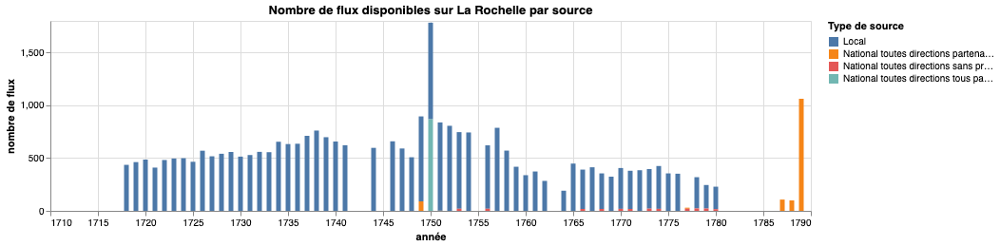

In [6]:
VegaLite({
    "$schema": "https://vega.github.io/schema/vega-lite/v5.json",
    "title": "Nombre de flux disponibles sur La Rochelle par source",
    "width": 800,
    "mark": "bar",
    "encoding": {
        "x": {
            "field": "year",
            "type": "quantitative", 
            "title": "année",
            "axis": {
                "format": "c"
            }
        },
        "y": {
            "field": "year",
            "type": "quantitative",
            "aggregate": "count",
            "title": "nombre de flux"
        },
        "color": {
            "field": "sourceType",
            "type": "nominal",
            "title": "Type de source"
        }
    }
}, pd.DataFrame(la_rochelle))

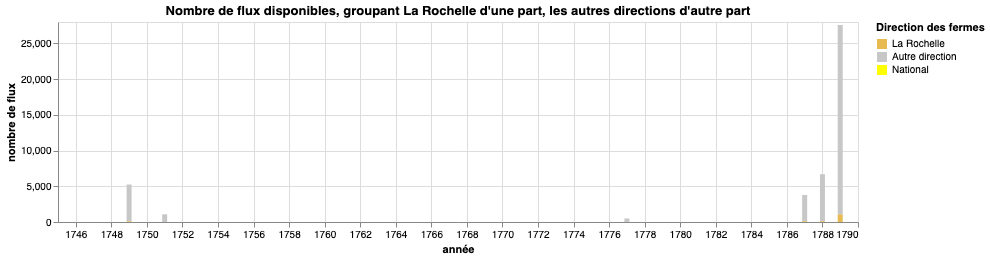

In [11]:
VegaLite({
    "$schema": "https://vega.github.io/schema/vega-lite/v5.json",
    "title": "Nombre de flux disponibles, groupant La Rochelle d'une part, les autres directions d'autre part",
    "width": 800,
    "mark": "bar",
    "encoding": {
        "x": {
            "field": "year",
            "type": "quantitative", 
            "title": "année",
            "axis": {
                "format": "c"
            }
        },
        "y": {
            "field": "year",
            "type": "quantitative",
            "aggregate": "count",
            "title": "nombre de flux"
        },
        "color": {
            "field": "region",
            "type": "nominal",
            "scale": {
                "domain": ["La Rochelle", "Autre direction", "National"],
                "range": ["#e7ba52", "#c7c7c7", "#ff0"]
            },
            "title": "Direction des fermes"
        }
    }
}, pd.DataFrame(by_larochelle))

In [ ]:
VegaLite({
    "$schema": "https://vega.github.io/schema/vega-lite/v5.json",
    "title": "Comparaison des valeurs cumulées des exports, groupant La Rochelle d'une part, les autres directions d'autre part",
    "width": 800,
    "mark": "bar",
    "encoding": {
        "x": {
            "field": "year",
            "type": "quantitative", 
            "title": "année",
            "axis": {
                "format": "c"
            }
        },
        "y": {
            "field": "value",
            "type": "quantitative",
            "aggregate": "sum",
            "title": "cumul des valeurs des flux (en Fr)"
        },
        "color": {
            "field": "region",
            "type": "nominal",
            "scale": {
                "domain": ["La Rochelle", "Autre direction"],
                "range": ["#e7ba52", "#c7c7c7"]
            },
            "title": "Direction des fermes"
        }
    }
}, pd.DataFrame(exports))

In [ ]:
VegaLite({
    "$schema": "https://vega.github.io/schema/vega-lite/v5.json",
    "title": "Comparaison des valeurs cumulées des imports, groupant La Rochelle d'une part, les autres directions d'autre part",
    "width": 800,
    "mark": "bar",
    "encoding": {
        "x": {
            "field": "year",
            "type": "quantitative", 
            "title": "année",
            "axis": {
                "format": "c"
            }
        },
        "y": {
            "field": "value",
            "type": "quantitative",
            "aggregate": "sum",
            "title": "cumul des valeurs des flux (en Fr)"
        },
        "color": {
            "field": "region",
            "type": "nominal",
            "scale": {
                "domain": ["La Rochelle", "Autre direction"],
                "range": ["#e7ba52", "#c7c7c7"]
            },
            "title": "Direction des fermes"
        }
    }
}, pd.DataFrame(imports))

In [ ]:
VegaLite({
    "$schema": "https://vega.github.io/schema/vega-lite/v5.json",
    "title": "Comparaison des valeurs cumulées des exports pour la Rochelle",
    "width": 800,
    "mark": "bar",
    "encoding": {
        "x": {
            "field": "year",
            "type": "quantitative", 
            "title": "année",
            "axis": {
                "format": "c"
            }
        },
        "y": {
            "field": "value",
            "type": "quantitative",
            "aggregate": "sum",
            "title": "cumul des valeurs des flux (en Fr)"
        },
        "color": {
            "field": "region",
            "type": "nominal",
            "scale": {
                "domain": ["La Rochelle", "Autre direction"],
                "range": ["#e7ba52", "#c7c7c7"]
            },
            "title": "Direction des fermes"
        }
    }
}, pd.DataFrame([f for f in exports if f["region"] == "La Rochelle"]))